<a href="https://colab.research.google.com/github/mBerezovskyy/caltech_birds2010/blob/master/birds_dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import tensorflow_datasets as tfds

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
data_dir='drive/MyDrive/birds_dataset/'

In [ ]:
train_dataset, train_info = tfds.load(name='caltech_birds2010', split='train', with_info=True, data_dir=data_dir, download=False)
test_dataset, testinfo = tfds.load(name='caltech_birds2010', split='test', with_info=True, data_dir=data_dir, download=False)

In [ ]:
train_info

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np

In [ ]:
def show_training_sample(image, tl_x, tl_y, br_x, br_y):

  tl_x = int(tl_x * image.shape[0])
  tl_y = int(tl_y * image.shape[1])
  br_x = int(br_x * image.shape[0])
  br_y = int(br_y * image.shape[1])

  cv2.rectangle(
      img=image,
      pt1=(tl_y, tl_x),
      pt2=(br_y, br_x),
      color=(0,255,0),
      thickness=2
  )
  cv2_imshow(image)
  print(image.shape)

In [ ]:
for element in train_dataset.take(5):
  image = element['image'].numpy()
  tl_y, tl_x, br_y, br_x = element['bbox'].numpy()
  show_training_sample(image, tl_y, tl_x, br_y, br_x)
  


In [ ]:
for element in train_dataset.take(5):
  image = element['image'].numpy()
  resized_img = cv2.resize(src=image, dsize=(500,500))

  tl_y, tl_x, br_y, br_x = element['bbox'].numpy()
  show_training_sample(resized_img, tl_y, tl_x, br_y, br_x)
  


In [ ]:
import tensorflow as tf

In [ ]:
IMAGE_SIZE = 528

In [ ]:
def preprocess(data):
  image = data['image']
  bbox = data['bbox'] * IMAGE_SIZE

  resized_image = tf.image.resize(images=image, size=[IMAGE_SIZE,IMAGE_SIZE])

  return tf.cast(resized_image, dtype=tf.float32) / 255.0, tf.cast(bbox, dtype=tf.int32)


In [ ]:
train_data = train_dataset.map(preprocess).batch(32).shuffle(32)
val_data = test_dataset.map(preprocess).batch(32).shuffle(32)

In [ ]:
for batch in val_data.take(1):
  for idx in range(len(batch[0])):
    image = batch[0]
    bbox = batch[1]

    tl_y, tl_x, br_y, br_x = bbox[idx].numpy()
    img = image[idx].numpy() * 255.0
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    cv2.rectangle(
        img=img,
        pt1=(tl_x, tl_y),
        pt2=(br_x, br_y),
        color=(0,255,0),
        thickness=2
    )

    cv2_imshow(img)

    print(tl_y, tl_x, br_y, br_x)
    print('\n\n')

In [ ]:
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.layers import GlobalAveragePooling2D, Flatten, Dense, Activation, Input,BatchNormalization, Dropout
from tensorflow.keras import Model
from tensorflow.keras.optimizers import Adam, SGD

In [ ]:
!pip install keras-tuner --quiet

In [ ]:
def build_model(hp):

  input = Input((IMAGE_SIZE, IMAGE_SIZE, 3))
  feature_extractor = InceptionV3(
      include_top=False
  )(input)

  x = GlobalAveragePooling2D()(feature_extractor)
  x = Flatten()(x)
  x = Dense(units=hp.Int("dense_1", min_value=32, max_value=1024, step=32))(x)
  x = Activation(activation=hp.Choice('activation_1', values=['relu', 'tanh', 'swish']))(x)
  x = Dense(units=hp.Int("dense_2", min_value=32, max_value=1024, step=32))(x)
  x = Activation(activation=hp.Choice('activation_2', values=['relu', 'tanh', 'swish']))(x)
  x = BatchNormalization()(x)
  output = Dense(4, 'linear')(x)

  model = Model(input, output)
  
  lr = hp.Choice("learning_rate", values=[1e-2, 1e-3])
  opt = Adam(learning_rate=lr)

  model.compile(
      optimizer=opt,
      loss='mse',
      metrics='acc'
  )


  return model

In [ ]:
import keras_tuner as kt

In [ ]:
!rm -rf untitled_project/

In [ ]:
tuner = kt.BayesianOptimization(
		build_model,
		objective="val_acc",
		max_trials=10
	)

stop_early = tf.keras.callbacks.EarlyStopping(monitor='val_acc', patience=3)

tensorboard = tf.keras.callbacks.TensorBoard(
    log_dir='logs',
    write_graph=True,
    write_images=True
)

tuner.search(train_data, epochs=10, validation_data=(val_data), callbacks=[tensorboard, stop_early])
best_model = tuner.get_best_models()[0]


Trial 10 Complete [00h 12m 34s]
val_acc: 0.7748104333877563

Best val_acc So Far: 0.832838773727417
Total elapsed time: 02h 03m 25s


In [ ]:
best_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 528, 528, 3)]     0         
                                                                 
 inception_v3 (Functional)   (None, None, None, 2048)  21802784  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 flatten (Flatten)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 128)               262272    
                                                                 
 activation_94 (Activation)  (None, 128)               0         
                                                             

In [ ]:
best_model.compile(optimizer=Adam(0.0001), loss='mse', metrics='acc')
best_model.fit(train_data, epochs=5, validation_data=(val_data))

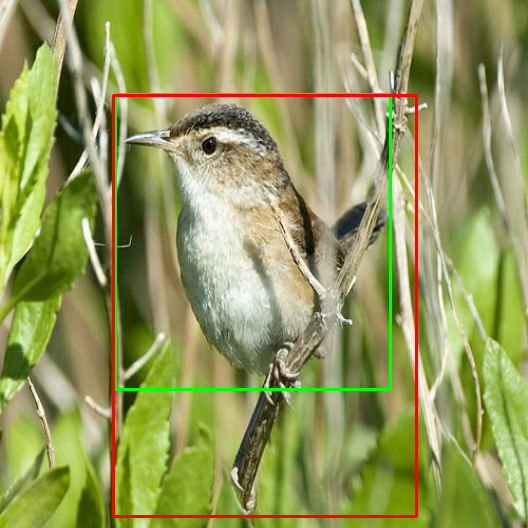

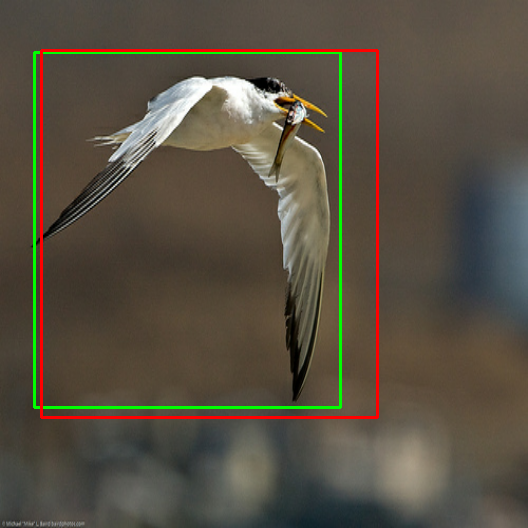

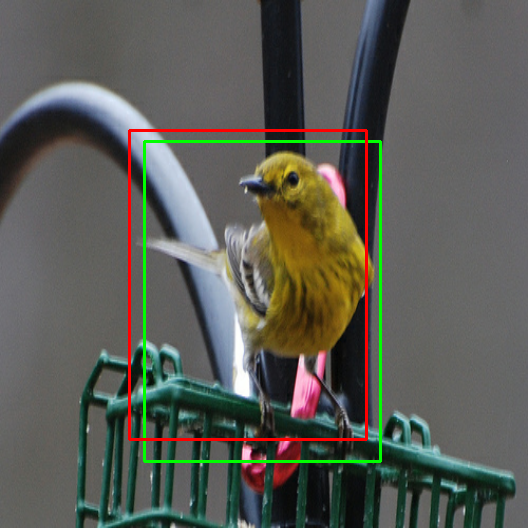

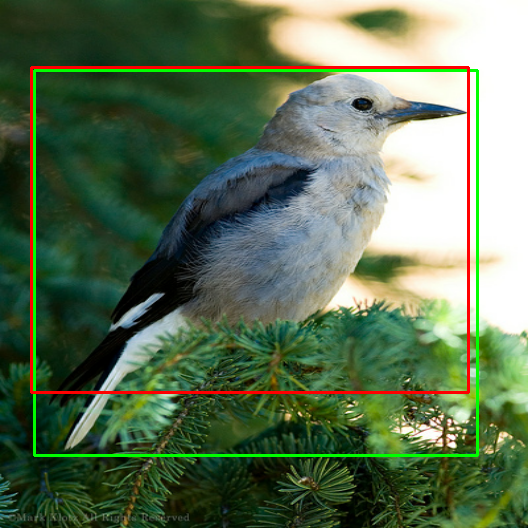

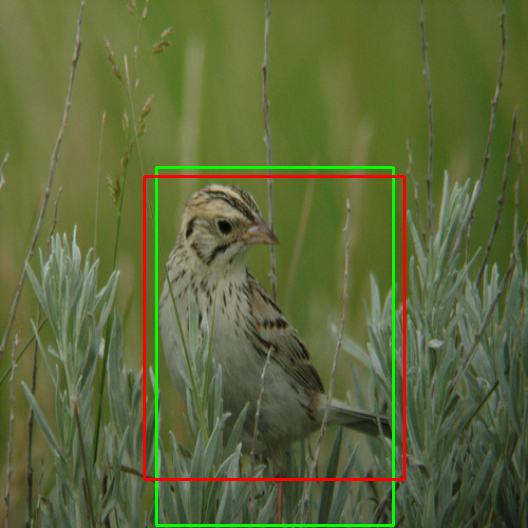

...

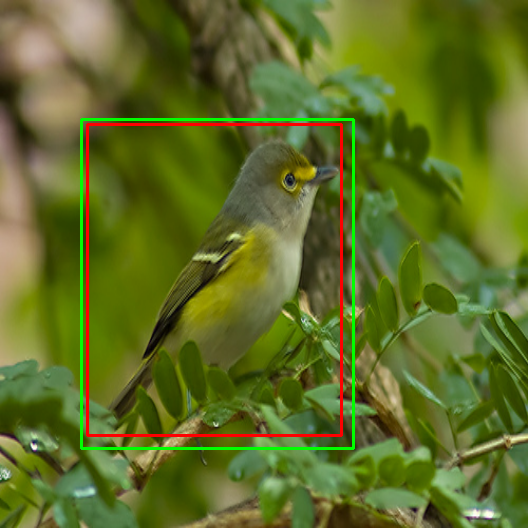

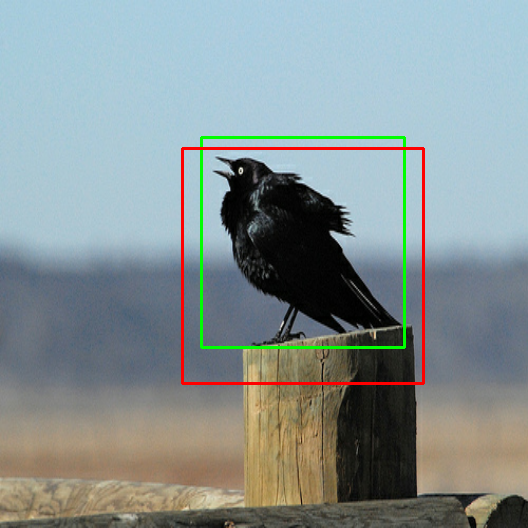

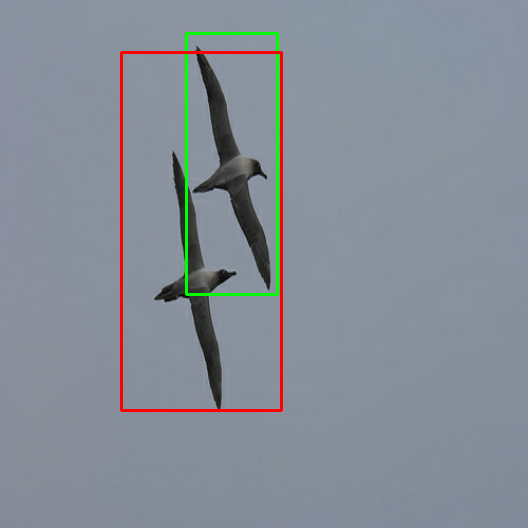

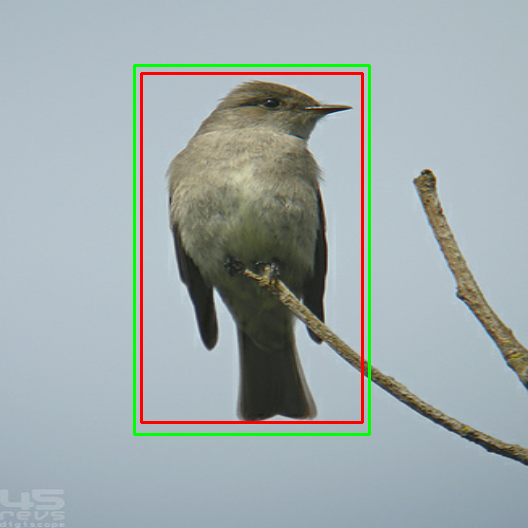

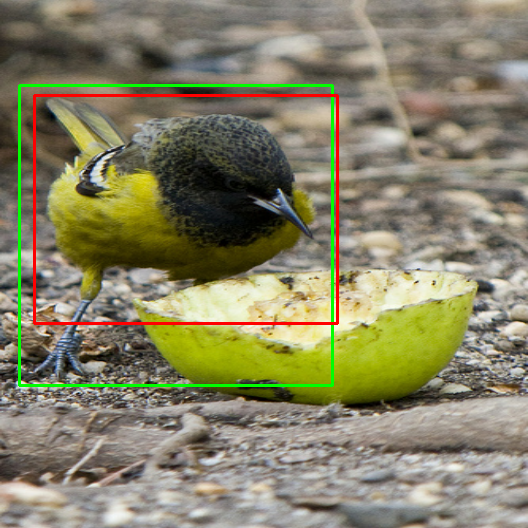

In [ ]:
for batch in val_data.take(1):
  for idx in range(len(batch[0])):
    image = batch[0]
    bbox = batch[1]

    tl_y, tl_x, br_y, br_x = bbox[idx].numpy()
    img = image[idx].numpy()

    img_to_show = img * 255

    img = tf.expand_dims(img, 0)

    predicted_coordinates = best_model.predict(img)

    img_to_show = cv2.cvtColor(img_to_show, cv2.COLOR_BGR2RGB)

    cv2.rectangle(
        img=img_to_show,
        pt1=(tl_x, tl_y),
        pt2=(br_x, br_y),
        color=(0,255,0),
        thickness=2
    )

    ptl_y, ptl_x, pbr_y, pbr_x = predicted_coordinates[0]

    cv2.rectangle(
        img=img_to_show,
        pt1=(int(ptl_x), int(ptl_y)),
        pt2=(int(pbr_x), int(pbr_y)),
        color=(0,0,255),
        thickness=2
    )
    

    cv2_imshow(img_to_show)

    print('\n\n')

In [ ]:
def predict_on_custom_img(filename, model):
  raw_img = tf.io.read_file(filename)
  img = tf.image.decode_image(raw_img)

  img_resized = tf.image.resize(img, [IMAGE_SIZE, IMAGE_SIZE])

  bbox = model.predict(tf.expand_dims(img_resized / 255.0, 0))

  ptl_y, ptl_x, pbr_y, pbr_x = bbox[0]

  img_to_show = img_resized.numpy()

  img_to_show = cv2.cvtColor(img_to_show, cv2.COLOR_BGR2RGB)

  cv2.rectangle(
        img=img_to_show,
        pt1=(int(ptl_x), int(ptl_y)),
        pt2=(int(pbr_x), int(pbr_y)),
        color=(0,0,255),
        thickness=2
    )
    

  cv2_imshow(img_to_show)  

In [ ]:
best_model.save('drive/MyDrive/birds_localization.h5')

Inference

In [ ]:
model = tf.keras.models.load_model('drive/MyDrive/birds_localization.h5')

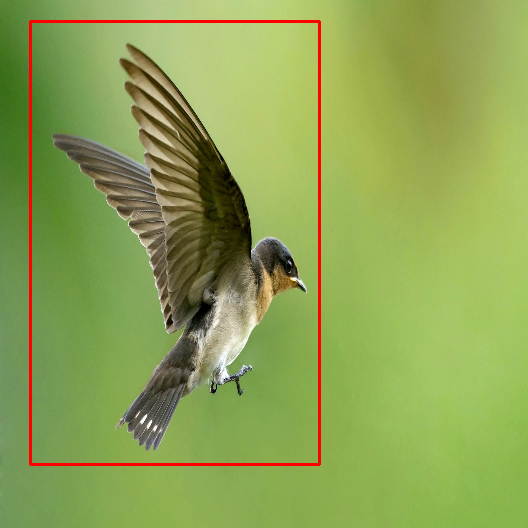

In [ ]:
predict_on_custom_img('bird2.jpg', model)

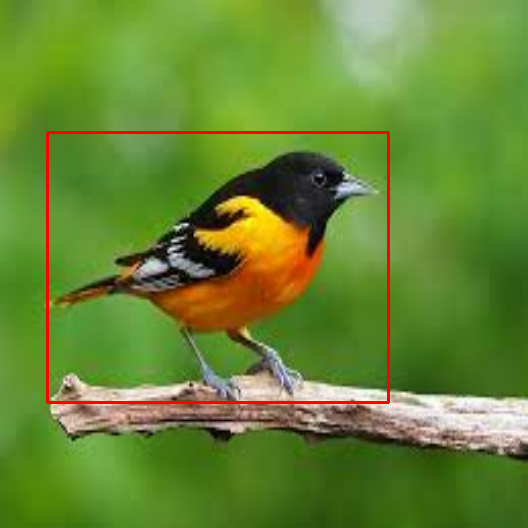

In [ ]:
predict_on_custom_img('bird.jpeg', model)

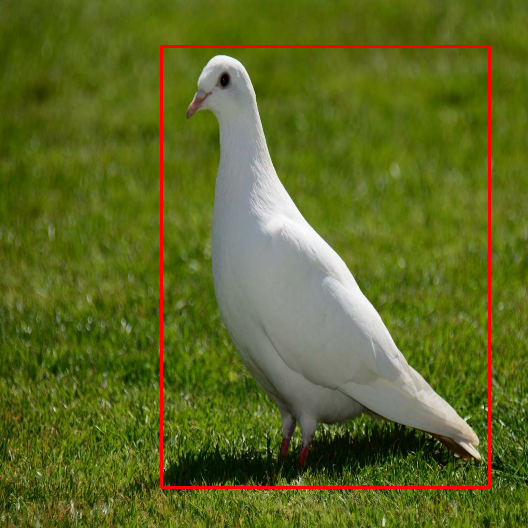

In [ ]:
predict_on_custom_img('bird3.jpg', model)

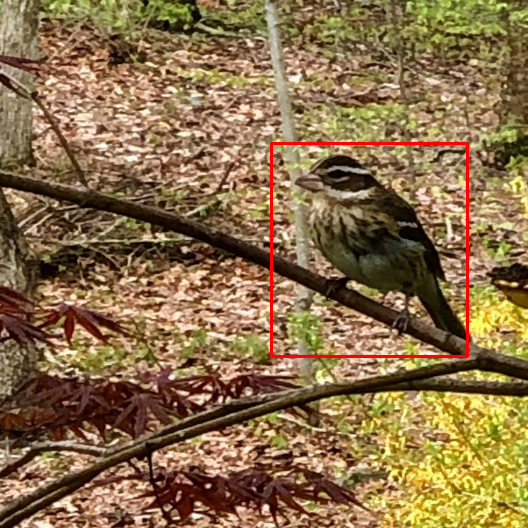

In [ ]:
predict_on_custom_img('bird-real2.jpeg', model)